<a href="https://colab.research.google.com/github/mayafetzer/Biomass_ML/blob/main/BiomassML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **PHARMA DATASET**

## With Categorical Variables

### Step 1: Download and preprocess the dataset


In [123]:
import pandas as pd

file_path = '/content/PHARMACEUTICAL DATAS.xlsx'

# Read the Excel file into a Pandas DataFrame
df = pd.read_excel(file_path)

# Print the first few rows of the DataFrame
print("The first 5 rows of the dataset:")
print(df.head())

# Print the description of the DataFrame
print("The descriptive statistics of the dataset")
print(df.describe())

# Get the data types of all columns
data_types = df.dtypes
# Print the datatypes of each column
print("The data types of each column:")
print(data_types)

# Get the numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
# Get the categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
# Print the results
print("Numeric columns:", numeric_cols)
print("Categorical columns:", categorical_cols)

The first 5 rows of the dataset:
  S/NO              TYPE OF BIOMASS                ADSORBENT ADSORBATE  \
0    1         AGRICULTURAL RESIDUE       AC FROM WHEAT DUST        TC   
1  NaN         AGRICULTURAL RESIDUE       AC FROM WHEAT DUST        TC   
2  NaN         AGRICULTURAL RESIDUE       AC FROM WHEAT DUST        TC   
3    2               FOREST RESIDUE         AC FROM OAK WOOD    PHENOL   
4    3  AGRICULTURAL RESIDUE(PEELS)  AC FROM MANGOSTEEN PEEL      Pb2+   

  MASS OF ADSORBENT(mg/L) VOLUME OF DYE/POLLUTANT(mL)   Ph  \
0                     0.1                         100  7.8   
1                     0.1                         100  7.8   
2                     0.1                         100  7.8   
3                     0.1                          20    4   
4                      50                         150    5   

  INITIAL CONCENTRATION OF ADSORBENT(mg/L) CONTACT TIME(MIN) TEMPERATURE(K)  \
0                                       50              1440          

In [124]:
import pandas as pd
import numpy as np

# List of columns to process
target_columns = [
    "MASS OF ADSORBENT(mg/L)",
    "VOLUME OF DYE/POLLUTANT(mL)",
    "Ph",
    "INITIAL CONCENTRATION OF ADSORBENT(mg/L)",
    "CONTACT TIME(MIN)",
    "TEMPERATURE(K)",
    "Absorption_Kinetics_PFO_Qexp(mg/g)",
    "Absorption_Kinetics_PFO_Qe cal(mg/g)",
    "K1(min-1)",
    "Absorption_Kinetics_PSO_Qe cal(mg/g)",
    "Absorption_Kinetics_PSO_K2(mg/g.min)",
    "Isotherm_Langmuir_Qmax(mg/g)",
    "Isotherm_Langmuir_KL(L/mg)",
    "Isotherm_Freundlich_Kf(mg/g)",
    "Isotherm_Freundlich_1/n",
    "PORE VOLUME(cm3/g)",
    "SURFACE AREA(m2/g) ",
    "ΔG(kJ /mol)",
    "ΔH( kJ/mol)",
    "ΔS( J/mol)"
]

# Clean each selected column
for col in target_columns:
    if col in df.columns:
        df[col] = df[col].apply(lambda x: np.nan if isinstance(x, str) and x.strip() == '-' else x)
        df[col] = pd.to_numeric(df[col], errors='coerce')
        mean_val = df[col].mean()
        df[col] = df[col].fillna(mean_val)

# Optional: Save cleaned version
# df.to_excel("cleaned_selected_columns_with_means.xlsx", index=False)

# Preview the result
print(df[target_columns].head())

# Get the data types of all columns
data_types = df.dtypes
# Print the datatypes of each column
print("The data types of each column:")
print(data_types)

# Get the numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
# Get the categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
# Print the results
print("Numeric columns:", numeric_cols)
print("Categorical columns:", categorical_cols)

   MASS OF ADSORBENT(mg/L)  VOLUME OF DYE/POLLUTANT(mL)   Ph  \
0                      0.1                        100.0  7.8   
1                      0.1                        100.0  7.8   
2                      0.1                        100.0  7.8   
3                      0.1                         20.0  4.0   
4                     50.0                        150.0  5.0   

   INITIAL CONCENTRATION OF ADSORBENT(mg/L)  CONTACT TIME(MIN)  \
0                                      50.0             1440.0   
1                                     100.0             1440.0   
2                                     150.0             1440.0   
3                                     100.0               20.0   
4                                      10.0              360.0   

   TEMPERATURE(K)  Absorption_Kinetics_PFO_Qexp(mg/g)  \
0           298.0                              500.00   
1           308.0                              995.41   
2           318.0                             1

In [125]:
# Drop the 'S/NO' column if it exists
df = df.drop(columns=['S/NO'], errors='ignore')

In [126]:
import pandas as pd
import numpy as np

# Step 1: Check for missing data
missing_data = df.isnull().sum()
print("Total missing values for each column before filling:")
print(missing_data[missing_data > 0])

df = df.dropna()

# Show how many columns still have missing values
print("\nMissing values in each column after handling:")
print(df.isnull().sum()[df.isnull().sum() > 0])

Total missing values for each column before filling:
TYPE OF BIOMASS    3
dtype: int64

Missing values in each column after handling:
Series([], dtype: int64)


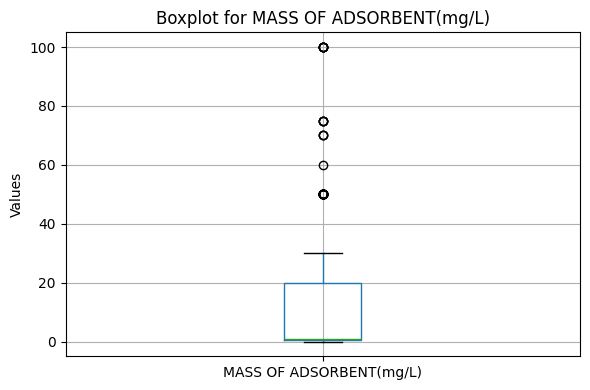

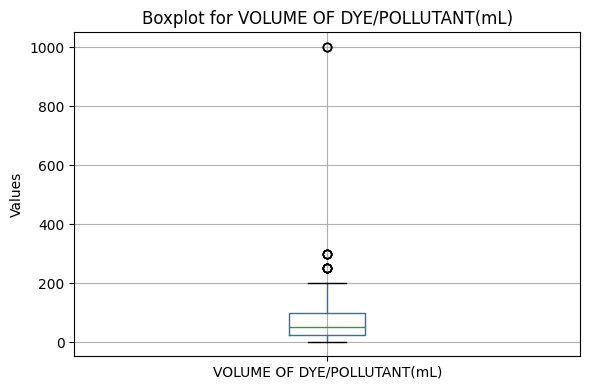

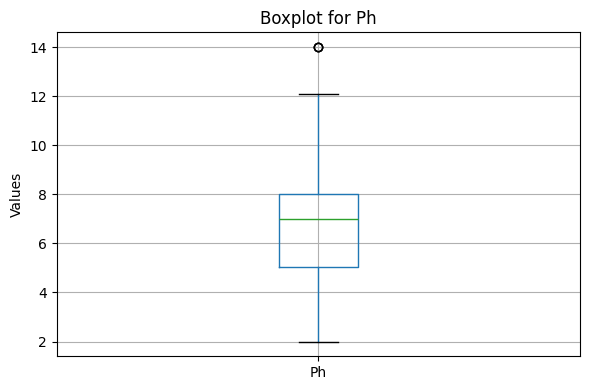

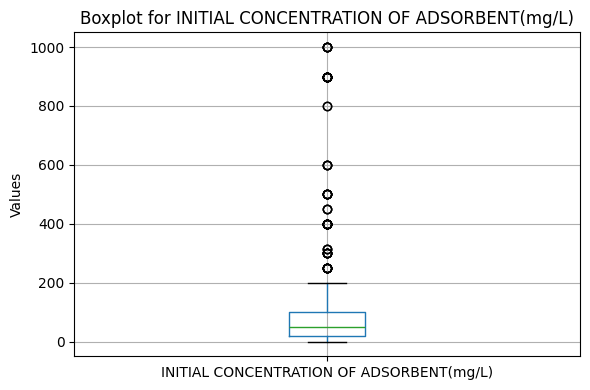

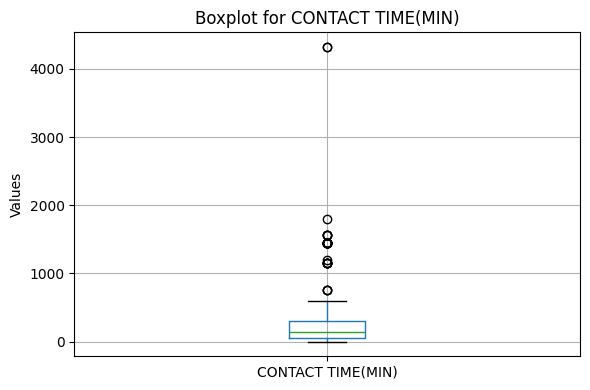

...

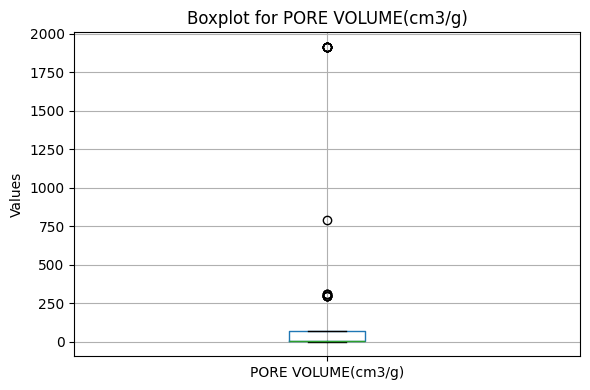

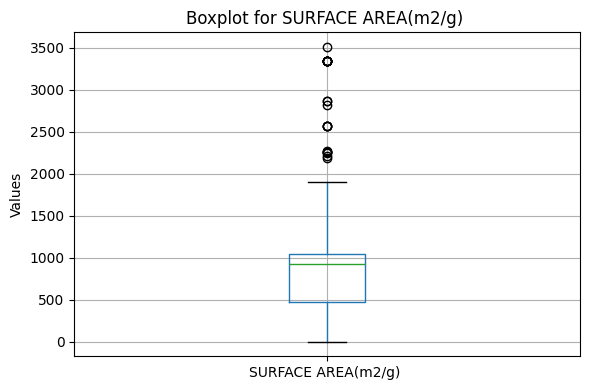

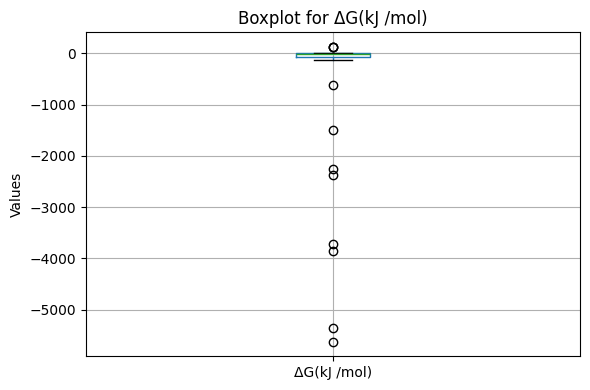

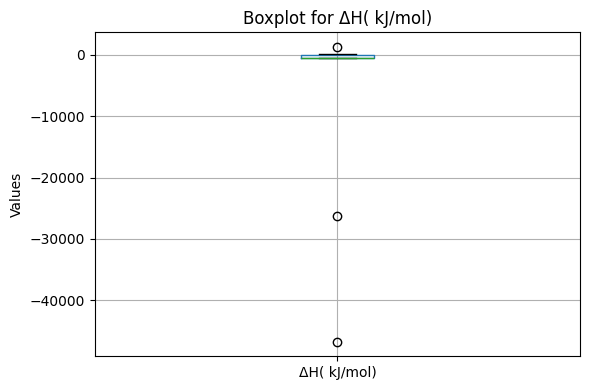

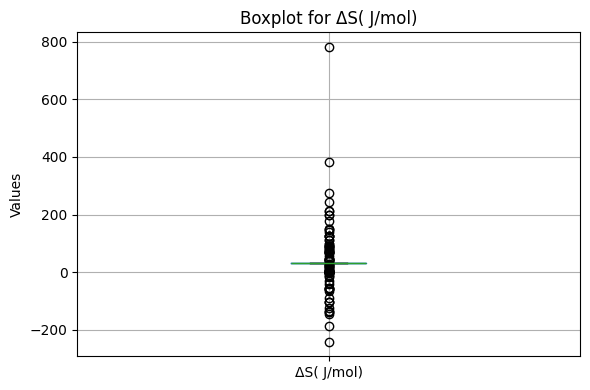

Column 'MASS OF ADSORBENT(mg/L)': 47 outliers (10.35% of values)
Column 'VOLUME OF DYE/POLLUTANT(mL)': 15 outliers (3.30% of values)
Column 'Ph': 3 outliers (0.66% of values)
Column 'INITIAL CONCENTRATION OF ADSORBENT(mg/L)': 70 outliers (15.42% of values)
Column 'CONTACT TIME(MIN)': 43 outliers (9.47% of values)
Column 'TEMPERATURE(K)': 17 outliers (3.74% of values)
Column 'Absorption_Kinetics_PFO_Qexp(mg/g)': 39 outliers (8.59% of values)
Column 'Absorption_Kinetics_PFO_Qe cal(mg/g)': 32 outliers (7.05% of values)
Column 'K1(min-1)': 18 outliers (3.96% of values)
Column 'Absorption_Kinetics_PSO_Qe cal(mg/g)': 44 outliers (9.69% of values)
Column 'Absorption_Kinetics_PSO_K2(mg/g.min)': 4 outliers (0.88% of values)
Column 'Isotherm_Langmuir_Qmax(mg/g)': 31 outliers (6.83% of values)
Column 'Isotherm_Langmuir_KL(L/mg)': 12 outliers (2.64% of values)
Column 'Isotherm_Freundlich_Kf(mg/g)': 32 outliers (7.05% of values)
Column 'Isotherm_Freundlich_1/n': 23 outliers (5.07% of values)
Column

In [127]:
import matplotlib.pyplot as plt
import numpy as np

# Dictionary to store outliers
outliers_dict = {}

# Select only numerical columns
columns_to_check = df.select_dtypes(include=['int64', 'float64']).columns

# Loop through each column
for col in columns_to_check:
    # Plot individual boxplot
    plt.figure(figsize=(6, 4))
    df.boxplot(column=col)
    plt.title(f"Boxplot for {col}")
    plt.ylabel("Values")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Outlier detection
    q1 = np.quantile(df[col], 0.25)
    q3 = np.quantile(df[col], 0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = df[col][(df[col] < lower_bound) | (df[col] > upper_bound)]
    outliers_dict[col] = outliers.tolist()

# Print summary of outliers for each column
for col, outliers in outliers_dict.items():
    total_outliers = len(outliers)
    total_values = len(df[col])
    percent_outliers = (total_outliers / total_values) * 100

    if total_outliers > 0:
        print(f"Column '{col}': {total_outliers} outliers ({percent_outliers:.2f}% of values)")
    else:
        print(f"Column '{col}': No outliers found")

In [128]:
# Select only numerical columns
columns_to_check = df.select_dtypes(include=['int64', 'float64']).columns

# Loop through each column
for col in columns_to_check:
    # Calculate bounds using IQR method
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Calculate mean of non-outlier values
    non_outlier_mean = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)][col].mean()

    # Replace outliers with the mean
    df[col] = df[col].apply(lambda x: non_outlier_mean if x < lower_bound or x > upper_bound else x)

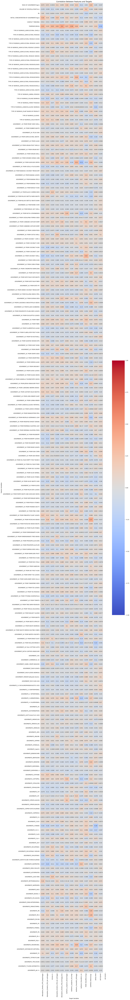

In [129]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# 1. One-hot encode categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
df = pd.get_dummies(df, columns=categorical_cols, drop_first=False)

# 2. Define original (pre-encoded) feature and target columns
target_cols = [
    'Absorption_Kinetics_PFO_Qexp(mg/g)', 'Absorption_Kinetics_PFO_Qe cal(mg/g)', 'K1(min-1)',
    'Absorption_Kinetics_PSO_Qe cal(mg/g)', 'Absorption_Kinetics_PSO_K2(mg/g.min)',
    'Isotherm_Langmuir_Qmax(mg/g)', 'Isotherm_Langmuir_KL(L/mg)', 'Isotherm_Freundlich_Kf(mg/g)',
    'Isotherm_Freundlich_1/n', 'PORE VOLUME(cm3/g)', 'SURFACE AREA(m2/g) ',
    'ΔG(kJ /mol)', 'ΔH( kJ/mol)', 'ΔS( J/mol)'
]

# 3. Identify encoded feature columns (everything not in target list)
feature_cols = [col for col in df.columns if col not in target_cols]

# 4. Normalize the entire dataset (features + targets)
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df[feature_cols + target_cols]), columns=feature_cols + target_cols)

# 5. Compute correlation matrix between features and targets only
correlation_matrix = df_scaled[feature_cols + target_cols].corr()

# Slice the matrix: rows = features, columns = targets
correlation_subset = correlation_matrix.loc[feature_cols, target_cols]

# 6. Plot a single heatmap
plt.figure(figsize=(15, max(8, 0.5 * len(feature_cols))))
sns.heatmap(correlation_subset, annot=True, cmap='coolwarm', center=0, vmin=-1, vmax=1)
plt.title('Correlation Between Features and Targets', fontsize=14)
plt.xlabel('Target Variables')
plt.ylabel('Feature Variables')
plt.tight_layout()
plt.show()

### Step 2: Develop a ML Model

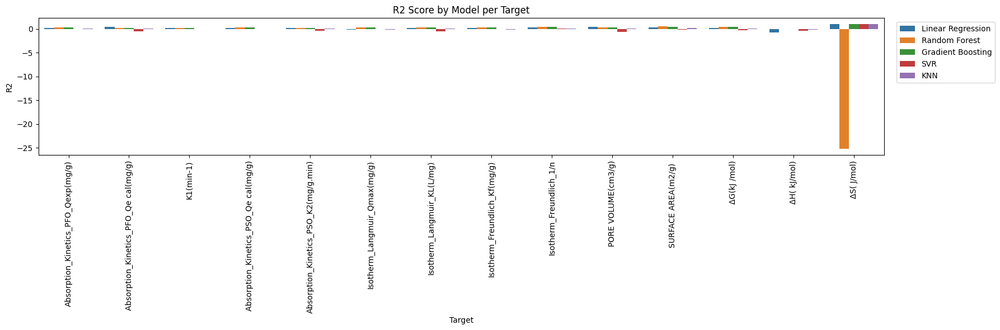

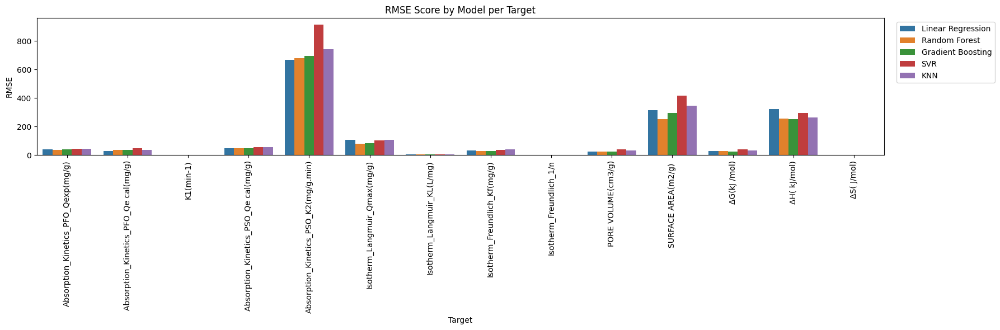

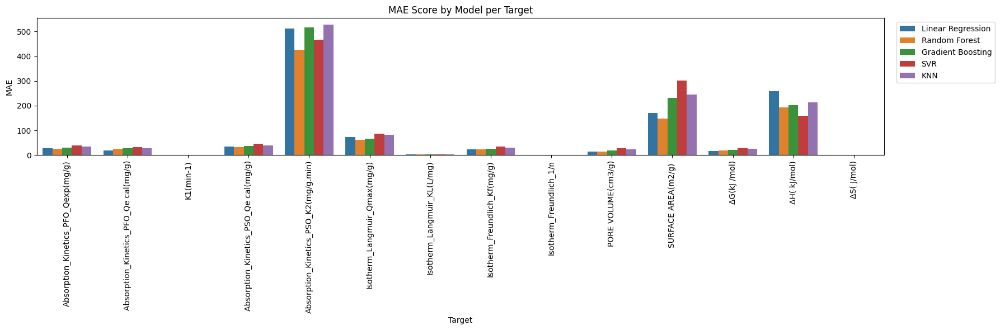


Summary Table:
                Model        R2        RMSE        MAE
0  Gradient Boosting  0.348343  109.703020  84.249896
1                KNN  0.107271  122.084843  89.683177
2  Linear Regression  0.257263  115.673645  82.466424
3      Random Forest -1.497078  105.065084  69.344916
4                SVR -0.110299  143.183591  87.321031

Best Model: Gradient Boosting


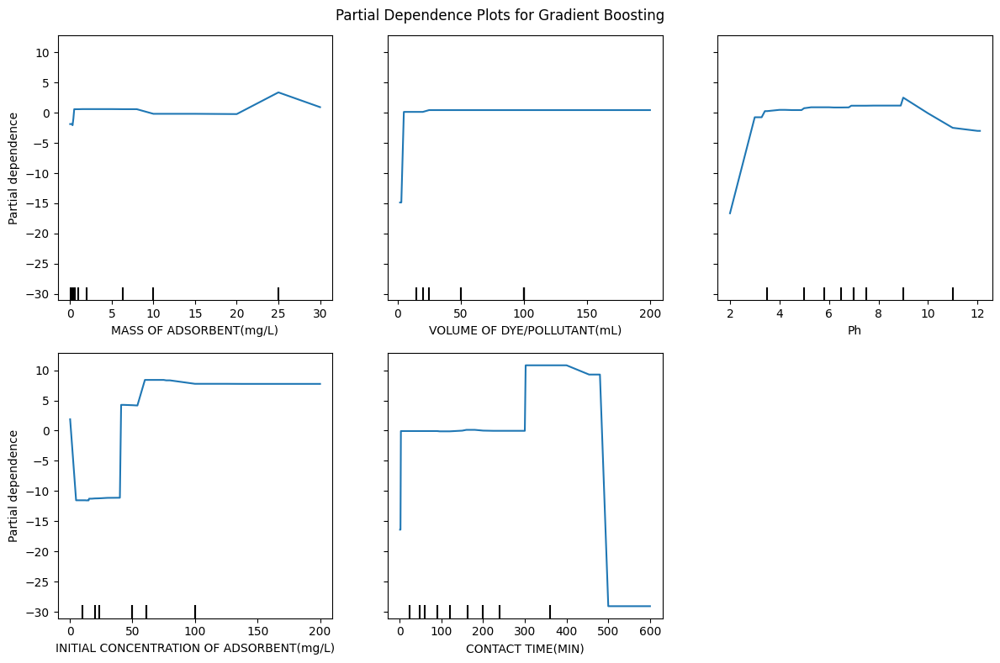

In [130]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.inspection import PartialDependenceDisplay

# 1. Define target and feature columns
target_cols = [
    'Absorption_Kinetics_PFO_Qexp(mg/g)', 'Absorption_Kinetics_PFO_Qe cal(mg/g)', 'K1(min-1)',
    'Absorption_Kinetics_PSO_Qe cal(mg/g)', 'Absorption_Kinetics_PSO_K2(mg/g.min)',
    'Isotherm_Langmuir_Qmax(mg/g)', 'Isotherm_Langmuir_KL(L/mg)', 'Isotherm_Freundlich_Kf(mg/g)',
    'Isotherm_Freundlich_1/n', 'PORE VOLUME(cm3/g)', 'SURFACE AREA(m2/g) ',
    'ΔG(kJ /mol)', 'ΔH( kJ/mol)', 'ΔS( J/mol)'
]

# Define categorical variable (adjust as needed)
categorical_var = 'Category'  # Example column name

feature_cols = [col for col in df.columns if col not in target_cols + [categorical_var]]

# 2. Define ML models
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
    'SVR': SVR(),
    'KNN': KNeighborsRegressor()
}

# 3. Train + Evaluate
results = []

for target in target_cols:
    X = df[feature_cols]
    y = df[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        results.append({
            'Target': target,
            'Model': model_name,
            'R2': r2_score(y_test, y_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
            'MAE': mean_absolute_error(y_test, y_pred)
        })

results_df = pd.DataFrame(results)

# 4. Plot performance
metrics = ['R2', 'RMSE', 'MAE']
for metric in metrics:
    plt.figure(figsize=(16, 6))
    sns.barplot(data=results_df, x='Target', y=metric, hue='Model')
    plt.title(f'{metric} Score by Model per Target')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
    plt.show()

# 5. Create Summary Table
numeric_columns = ['R2', 'RMSE', 'MAE']
summary_table = results_df[numeric_columns + ['Model']].groupby('Model').mean().reset_index()
print("\nSummary Table:\n", summary_table)

# 6. Partial Dependence Plots for Best Model
best_model_name = summary_table.loc[summary_table['R2'].idxmax(), 'Model']
print(f"\nBest Model: {best_model_name}")

if best_model_name in models:
    best_model = models[best_model_name]
    X_train, X_test, y_train, y_test = train_test_split(df[feature_cols], df[target_cols[0]], test_size=0.2, random_state=42)
    best_model.fit(X_train, y_train)

    features_to_plot = feature_cols[:5]  # Adjust this list as needed
    fig, ax = plt.subplots(figsize=(12, 8))
    PartialDependenceDisplay.from_estimator(best_model, X_train, features_to_plot, ax=ax)
    plt.suptitle(f"Partial Dependence Plots for {best_model_name}")
    plt.tight_layout()
    plt.show()

    # Categorical Variable Analysis
    if categorical_var in df.columns:
        for category in df[categorical_var].unique():
            subset = df[df[categorical_var] == category]
            if not subset.empty:
                X_cat = subset[feature_cols]
                y_cat = subset[target_cols[0]]  # Using the first target as an example
                fig, ax = plt.subplots(figsize=(12, 8))
                PartialDependenceDisplay.from_estimator(best_model, X_cat, features_to_plot, ax=ax)
                plt.suptitle(f"Partial Dependence for {best_model_name} - {category}")
                plt.tight_layout()
                plt.show()
else:
    print("Best model not found in the defined models.")


In [131]:
import pickle
with open('pharma_categorical.pkl', 'wb') as f:
    pickle.dump(best_model, f)

## Without Categorical Variables

### Step 1: Download and preprocess the dataset


In [132]:
import pandas as pd

file_path = '/content/PHARMACEUTICAL DATAS.xlsx'

# Read the Excel file into a Pandas DataFrame
df = pd.read_excel(file_path)

# Print the first few rows of the DataFrame
print("The first 5 rows of the dataset:")
print(df.head())

# Print the description of the DataFrame
print("The descriptive statistics of the dataset")
print(df.describe())

# Get the data types of all columns
data_types = df.dtypes
# Print the datatypes of each column
print("The data types of each column:")
print(data_types)

# Get the numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
# Get the categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
# Print the results
print("Numeric columns:", numeric_cols)
print("Categorical columns:", categorical_cols)

The first 5 rows of the dataset:
  S/NO              TYPE OF BIOMASS                ADSORBENT ADSORBATE  \
0    1         AGRICULTURAL RESIDUE       AC FROM WHEAT DUST        TC   
1  NaN         AGRICULTURAL RESIDUE       AC FROM WHEAT DUST        TC   
2  NaN         AGRICULTURAL RESIDUE       AC FROM WHEAT DUST        TC   
3    2               FOREST RESIDUE         AC FROM OAK WOOD    PHENOL   
4    3  AGRICULTURAL RESIDUE(PEELS)  AC FROM MANGOSTEEN PEEL      Pb2+   

  MASS OF ADSORBENT(mg/L) VOLUME OF DYE/POLLUTANT(mL)   Ph  \
0                     0.1                         100  7.8   
1                     0.1                         100  7.8   
2                     0.1                         100  7.8   
3                     0.1                          20    4   
4                      50                         150    5   

  INITIAL CONCENTRATION OF ADSORBENT(mg/L) CONTACT TIME(MIN) TEMPERATURE(K)  \
0                                       50              1440          

In [133]:
import pandas as pd
import numpy as np

# List of columns to process
target_columns = [
    "MASS OF ADSORBENT(mg/L)",
    "VOLUME OF DYE/POLLUTANT(mL)",
    "Ph",
    "INITIAL CONCENTRATION OF ADSORBENT(mg/L)",
    "CONTACT TIME(MIN)",
    "TEMPERATURE(K)",
    "Absorption_Kinetics_PFO_Qexp(mg/g)",
    "Absorption_Kinetics_PFO_Qe cal(mg/g)",
    "K1(min-1)",
    "Absorption_Kinetics_PSO_Qe cal(mg/g)",
    "Absorption_Kinetics_PSO_K2(mg/g.min)",
    "Isotherm_Langmuir_Qmax(mg/g)",
    "Isotherm_Langmuir_KL(L/mg)",
    "Isotherm_Freundlich_Kf(mg/g)",
    "Isotherm_Freundlich_1/n",
    "PORE VOLUME(cm3/g)",
    "SURFACE AREA(m2/g) ",
    "ΔG(kJ /mol)",
    "ΔH( kJ/mol)",
    "ΔS( J/mol)"
]

# Clean each selected column
for col in target_columns:
    if col in df.columns:
        df[col] = df[col].apply(lambda x: np.nan if isinstance(x, str) and x.strip() == '-' else x)
        df[col] = pd.to_numeric(df[col], errors='coerce')
        mean_val = df[col].mean()
        df[col] = df[col].fillna(mean_val)

# Optional: Save cleaned version
# df.to_excel("cleaned_selected_columns_with_means.xlsx", index=False)

# Preview the result
print(df[target_columns].head())

# Get the data types of all columns
data_types = df.dtypes
# Print the datatypes of each column
print("The data types of each column:")
print(data_types)

# Get the numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
# Get the categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
# Print the results
print("Numeric columns:", numeric_cols)
print("Categorical columns:", categorical_cols)

   MASS OF ADSORBENT(mg/L)  VOLUME OF DYE/POLLUTANT(mL)   Ph  \
0                      0.1                        100.0  7.8   
1                      0.1                        100.0  7.8   
2                      0.1                        100.0  7.8   
3                      0.1                         20.0  4.0   
4                     50.0                        150.0  5.0   

   INITIAL CONCENTRATION OF ADSORBENT(mg/L)  CONTACT TIME(MIN)  \
0                                      50.0             1440.0   
1                                     100.0             1440.0   
2                                     150.0             1440.0   
3                                     100.0               20.0   
4                                      10.0              360.0   

   TEMPERATURE(K)  Absorption_Kinetics_PFO_Qexp(mg/g)  \
0           298.0                              500.00   
1           308.0                              995.41   
2           318.0                             1

In [134]:
# Drop the 'S/NO' column if it exists
df = df.drop(columns=['S/NO', 'Unnamed: 24'], errors='ignore')

df = df.drop(columns=categorical_cols, errors='ignore')

# Get the data types of all columns
data_types = df.dtypes
# Print the datatypes of each column
print("The data types of each column:")
print(data_types)

# Get the numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
# Get the categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
# Print the results
print("Numeric columns:", numeric_cols)
print("Categorical columns:", categorical_cols)

The data types of each column:
MASS OF ADSORBENT(mg/L)                     float64
VOLUME OF DYE/POLLUTANT(mL)                 float64
Ph                                          float64
INITIAL CONCENTRATION OF ADSORBENT(mg/L)    float64
CONTACT TIME(MIN)                           float64
TEMPERATURE(K)                              float64
Absorption_Kinetics_PFO_Qexp(mg/g)          float64
Absorption_Kinetics_PFO_Qe cal(mg/g)        float64
K1(min-1)                                   float64
Absorption_Kinetics_PSO_Qe cal(mg/g)        float64
Absorption_Kinetics_PSO_K2(mg/g.min)        float64
Isotherm_Langmuir_Qmax(mg/g)                float64
Isotherm_Langmuir_KL(L/mg)                  float64
Isotherm_Freundlich_Kf(mg/g)                float64
Isotherm_Freundlich_1/n                     float64
PORE VOLUME(cm3/g)                          float64
SURFACE AREA(m2/g)                          float64
ΔG(kJ /mol)                                 float64
ΔH( kJ/mol)                      

In [135]:
import pandas as pd
import numpy as np

# Step 1: Check for missing data
missing_data = df.isnull().sum()
print("Total missing values for each column before filling:")
print(missing_data[missing_data > 0])

df = df.dropna()

# Show how many columns still have missing values
print("\nMissing values in each column after handling:")
print(df.isnull().sum()[df.isnull().sum() > 0])

Total missing values for each column before filling:
Series([], dtype: int64)

Missing values in each column after handling:
Series([], dtype: int64)


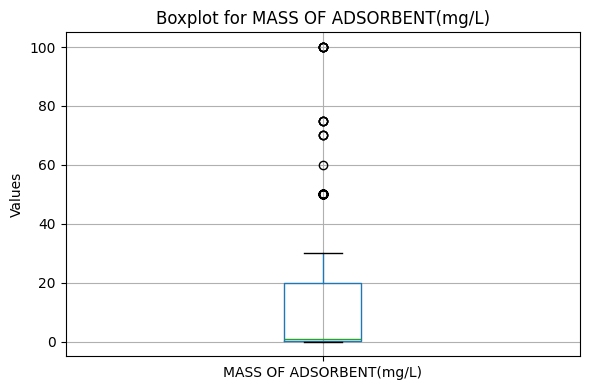

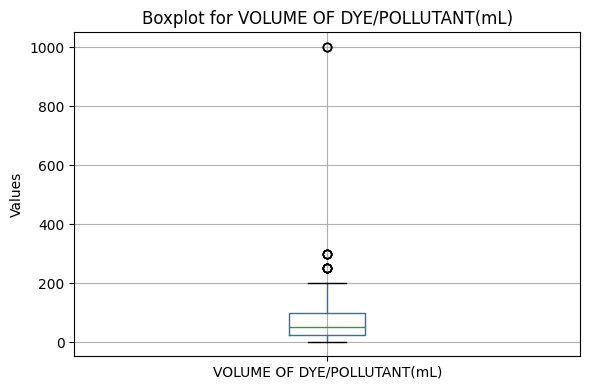

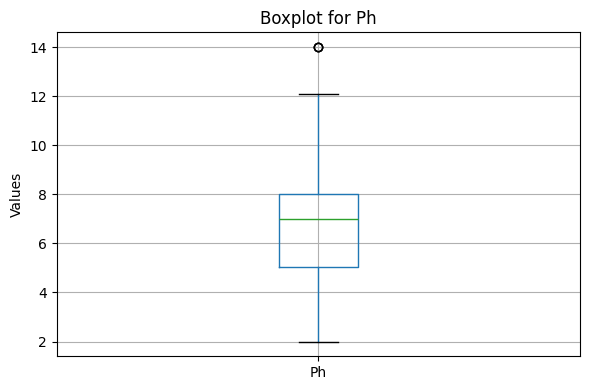

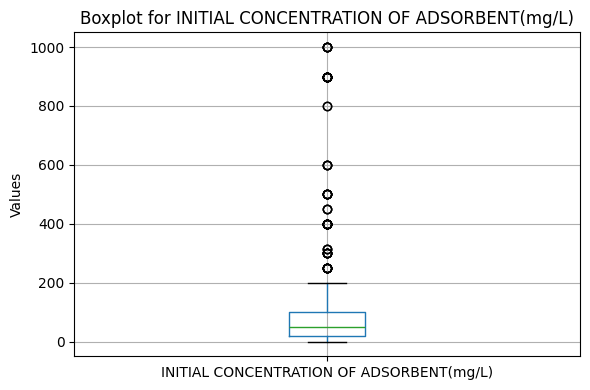

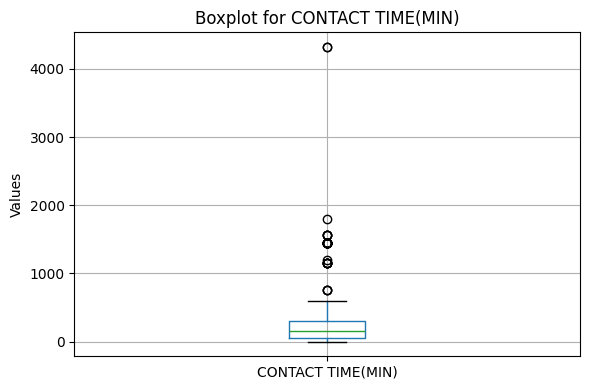

...

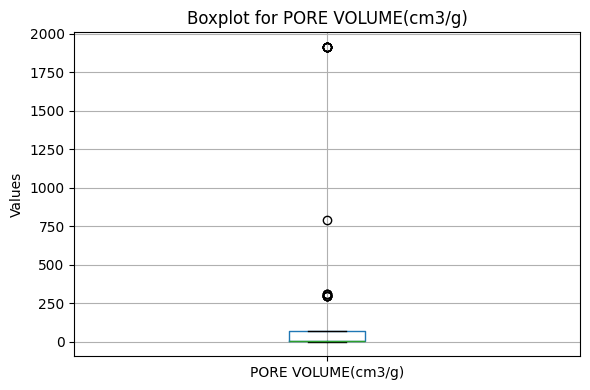

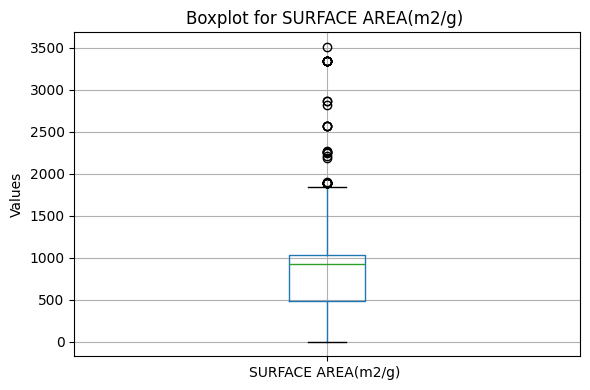

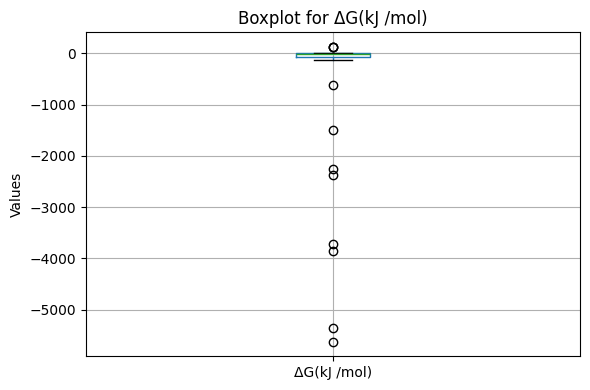

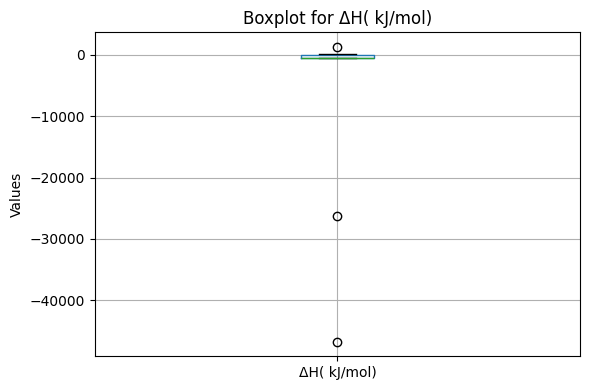

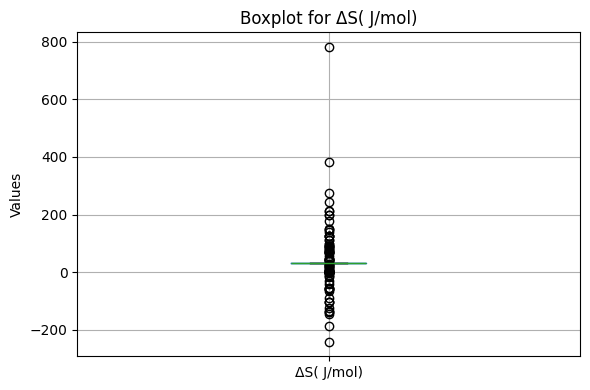

Column 'MASS OF ADSORBENT(mg/L)': 47 outliers (10.28% of values)
Column 'VOLUME OF DYE/POLLUTANT(mL)': 15 outliers (3.28% of values)
Column 'Ph': 3 outliers (0.66% of values)
Column 'INITIAL CONCENTRATION OF ADSORBENT(mg/L)': 70 outliers (15.32% of values)
Column 'CONTACT TIME(MIN)': 43 outliers (9.41% of values)
Column 'TEMPERATURE(K)': 17 outliers (3.72% of values)
Column 'Absorption_Kinetics_PFO_Qexp(mg/g)': 37 outliers (8.10% of values)
Column 'Absorption_Kinetics_PFO_Qe cal(mg/g)': 31 outliers (6.78% of values)
Column 'K1(min-1)': 18 outliers (3.94% of values)
Column 'Absorption_Kinetics_PSO_Qe cal(mg/g)': 43 outliers (9.41% of values)
Column 'Absorption_Kinetics_PSO_K2(mg/g.min)': 4 outliers (0.88% of values)
Column 'Isotherm_Langmuir_Qmax(mg/g)': 31 outliers (6.78% of values)
Column 'Isotherm_Langmuir_KL(L/mg)': 12 outliers (2.63% of values)
Column 'Isotherm_Freundlich_Kf(mg/g)': 32 outliers (7.00% of values)
Column 'Isotherm_Freundlich_1/n': 22 outliers (4.81% of values)
Column

In [136]:
import matplotlib.pyplot as plt
import numpy as np

# Dictionary to store outliers
outliers_dict = {}

# Select only numerical columns
columns_to_check = df.select_dtypes(include=['int64', 'float64']).columns

# Loop through each column
for col in columns_to_check:
    # Plot individual boxplot
    plt.figure(figsize=(6, 4))
    df.boxplot(column=col)
    plt.title(f"Boxplot for {col}")
    plt.ylabel("Values")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Outlier detection
    q1 = np.quantile(df[col], 0.25)
    q3 = np.quantile(df[col], 0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = df[col][(df[col] < lower_bound) | (df[col] > upper_bound)]
    outliers_dict[col] = outliers.tolist()

# Print summary of outliers for each column
for col, outliers in outliers_dict.items():
    total_outliers = len(outliers)
    total_values = len(df[col])
    percent_outliers = (total_outliers / total_values) * 100

    if total_outliers > 0:
        print(f"Column '{col}': {total_outliers} outliers ({percent_outliers:.2f}% of values)")
    else:
        print(f"Column '{col}': No outliers found")

In [137]:
# Select only numerical columns
columns_to_check = df.select_dtypes(include=['int64', 'float64']).columns

# Loop through each column
for col in columns_to_check:
    # Calculate bounds using IQR method
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Calculate mean of non-outlier values
    non_outlier_mean = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)][col].mean()

    # Replace outliers with the mean
    df[col] = df[col].apply(lambda x: non_outlier_mean if x < lower_bound or x > upper_bound else x)

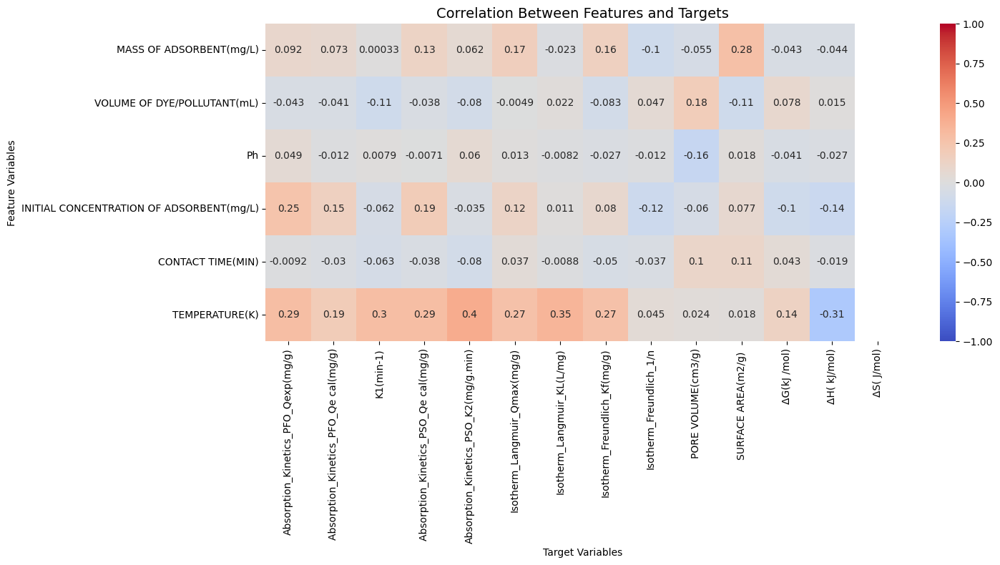

In [138]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# 1. One-hot encode categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
## df = pd.get_dummies(df, columns=categorical_cols, drop_first=False)

# 2. Define original (pre-encoded) feature and target columns
target_cols = [
    'Absorption_Kinetics_PFO_Qexp(mg/g)', 'Absorption_Kinetics_PFO_Qe cal(mg/g)', 'K1(min-1)',
    'Absorption_Kinetics_PSO_Qe cal(mg/g)', 'Absorption_Kinetics_PSO_K2(mg/g.min)',
    'Isotherm_Langmuir_Qmax(mg/g)', 'Isotherm_Langmuir_KL(L/mg)', 'Isotherm_Freundlich_Kf(mg/g)',
    'Isotherm_Freundlich_1/n', 'PORE VOLUME(cm3/g)', 'SURFACE AREA(m2/g) ',
    'ΔG(kJ /mol)', 'ΔH( kJ/mol)', 'ΔS( J/mol)'
]

# 3. Identify encoded feature columns (everything not in target list)
feature_cols = [col for col in df.columns if col not in target_cols]

# 4. Normalize the entire dataset (features + targets)
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df[feature_cols + target_cols]), columns=feature_cols + target_cols)

# 5. Compute correlation matrix between features and targets only
correlation_matrix = df_scaled[feature_cols + target_cols].corr()

# Slice the matrix: rows = features, columns = targets
correlation_subset = correlation_matrix.loc[feature_cols, target_cols]

# 6. Plot a single heatmap
plt.figure(figsize=(15, max(8, 0.5 * len(feature_cols))))
sns.heatmap(correlation_subset, annot=True, cmap='coolwarm', center=0, vmin=-1, vmax=1)
plt.title('Correlation Between Features and Targets', fontsize=14)
plt.xlabel('Target Variables')
plt.ylabel('Feature Variables')
plt.tight_layout()
plt.show()

### Step 2: Develop a ML Model

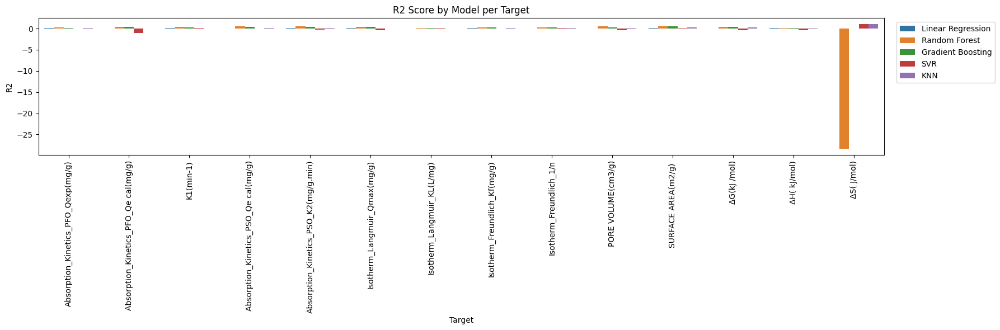

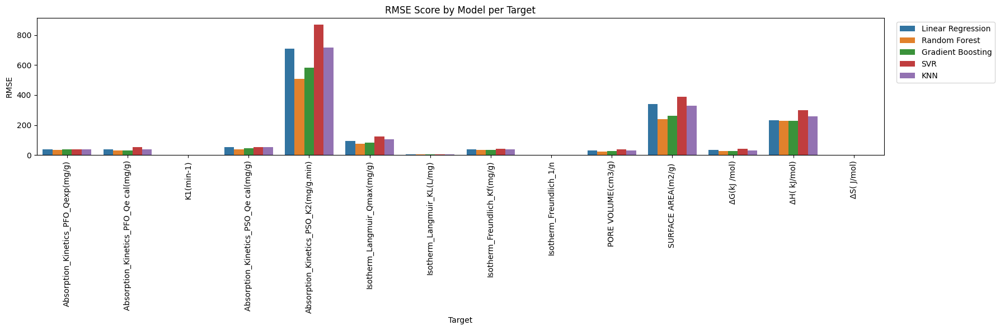

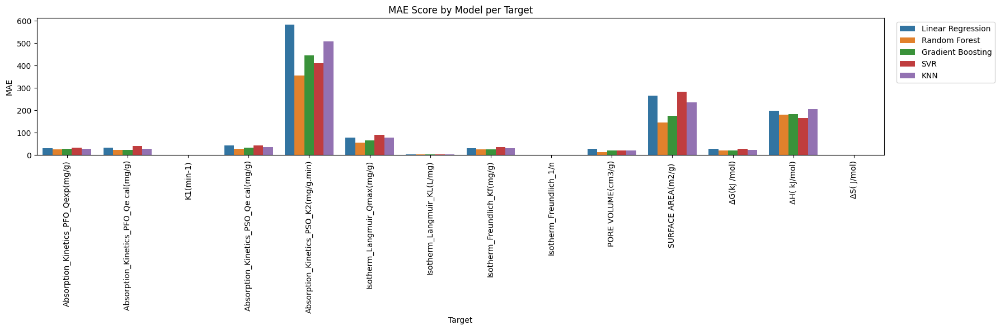


Summary Table:
                Model        R2        RMSE        MAE
0  Gradient Boosting  0.285780   97.195677  73.077518
1                KNN  0.154541  117.081340  85.658233
2  Linear Regression  0.071251  115.108954  94.774977
3      Random Forest -1.676035   88.767993  62.411085
4                SVR -0.136346  139.363177  82.604963

Best Model: Gradient Boosting


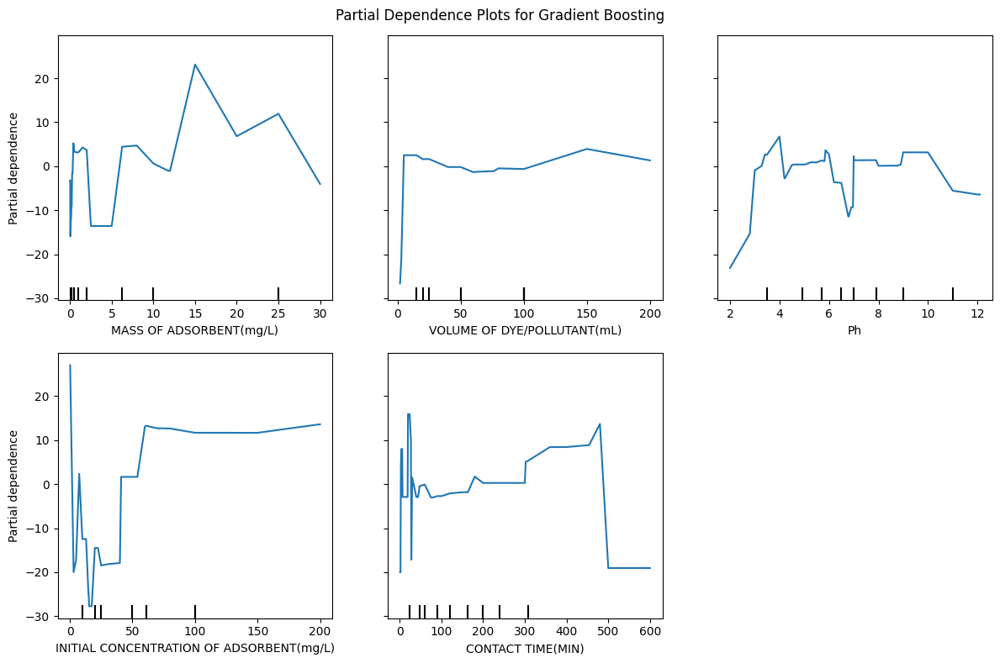

In [139]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.inspection import PartialDependenceDisplay

# 1. Define target and feature columns
target_cols = [
    'Absorption_Kinetics_PFO_Qexp(mg/g)', 'Absorption_Kinetics_PFO_Qe cal(mg/g)', 'K1(min-1)',
    'Absorption_Kinetics_PSO_Qe cal(mg/g)', 'Absorption_Kinetics_PSO_K2(mg/g.min)',
    'Isotherm_Langmuir_Qmax(mg/g)', 'Isotherm_Langmuir_KL(L/mg)', 'Isotherm_Freundlich_Kf(mg/g)',
    'Isotherm_Freundlich_1/n', 'PORE VOLUME(cm3/g)', 'SURFACE AREA(m2/g) ',
    'ΔG(kJ /mol)', 'ΔH( kJ/mol)', 'ΔS( J/mol)'
]
feature_cols = [col for col in df.columns if col not in target_cols]

# 2. Define ML models
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
    'SVR': SVR(),
    'KNN': KNeighborsRegressor()
}

# 3. Train + Evaluate
results = []

for target in target_cols:
    X = df[feature_cols]
    y = df[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        results.append({
            'Target': target,
            'Model': model_name,
            'R2': r2_score(y_test, y_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
            'MAE': mean_absolute_error(y_test, y_pred)
        })

results_df = pd.DataFrame(results)

# 4. Plot performance
metrics = ['R2', 'RMSE', 'MAE']
for metric in metrics:
    plt.figure(figsize=(16, 6))
    sns.barplot(data=results_df, x='Target', y=metric, hue='Model')
    plt.title(f'{metric} Score by Model per Target')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
    plt.show()

# 5. Create Summary Table
numeric_columns = ['R2', 'RMSE', 'MAE']
summary_table = results_df[numeric_columns + ['Model']].groupby('Model').mean().reset_index()
print("\nSummary Table:\n", summary_table)

# 6. Partial Dependence Plots for Best Model
best_model_name = summary_table.loc[summary_table['R2'].idxmax(), 'Model']
print(f"\nBest Model: {best_model_name}")

if best_model_name in models:
    best_model = models[best_model_name]
    X_train, X_test, y_train, y_test = train_test_split(df[feature_cols], df[target_cols[0]], test_size=0.2, random_state=42)
    best_model.fit(X_train, y_train)

    features_to_plot = feature_cols[:5]  # Adjust this list as needed
    fig, ax = plt.subplots(figsize=(12, 8))
    PartialDependenceDisplay.from_estimator(best_model, X_train, features_to_plot, ax=ax)
    plt.suptitle(f"Partial Dependence Plots for {best_model_name}")
    plt.tight_layout()
    plt.show()
else:
    print("Best model not found in the defined models.")

In [140]:
import pickle
with open('pharma_no_categorical.pkl', 'wb') as f:
    pickle.dump(best_model, f)

# **DYE DATASET**

## With Categorical Variables

### Step 1: Download and preprocess the dataset


In [106]:
import pandas as pd

file_path = '/content/DYE DATAS.xlsx'

# Read the Excel file into a Pandas DataFrame
df = pd.read_excel(file_path)

# Print the first few rows of the DataFrame
print("The first 5 rows of the dataset:")
print(df.head())

# Print the description of the DataFrame
print("The descriptive statistics of the dataset")
print(df.describe())

# Get the data types of all columns
data_types = df.dtypes
# Print the datatypes of each column
print("The data types of each column:")
print(data_types)

# Get the numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
# Get the categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
# Print the results
print("Numeric columns:", numeric_cols)
print("Categorical columns:", categorical_cols)

The first 5 rows of the dataset:
   S/NO       TYPE OF BIOMASS                  ADSORBENT ADSORBATE  \
0   1.0  AGRICULTURAL RESIDUE            AC FROM BAGASSE        MB   
1   2.0        FOREST RESIDUE          AC from Birchwood        MO   
2   NaN        FOREST RESIDUE          AC from Birchwood        MB   
3   3.0  AGRICULTURAL RESIDUE  AC FROM GROUND PALM STEMS        MB   
4   NaN  AGRICULTURAL RESIDUE  AC FROM GROUND PALM STEMS        MB   

  MASS OF ADSORBENT(mg/L) VOLUME OF DYE/POLLUTANT(mL)  Ph  \
0                       6                         100   2   
1                     2.5                          50  11   
2                     2.5                          50  11   
3                    0.03                          80   8   
4                    0.03                          80   8   

   INITIAL CONCENTRATION OF ADSORBENT(mg/L) CONTACT TIME(MIN) TEMPERATURE(K)  \
0                                      30.0               120            298   
1                  

In [107]:
import pandas as pd
import numpy as np

# List of columns to process
target_columns = [
    "MASS OF ADSORBENT(mg/L)",
    "VOLUME OF DYE/POLLUTANT(mL)",
    "Ph",
    "INITIAL CONCENTRATION OF ADSORBENT(mg/L)",
    "CONTACT TIME(MIN)",
    "TEMPERATURE(K)",
    "Absorption_Kinetics_PFO_Qexp(mg/g)",
    "Absorption_Kinetics_PFO_Qe cal(mg/g)",
    "K1(min-1)",
    "Absorption_Kinetics_PSO_Qe cal(mg/g)",
    "Absorption_Kinetics_PSO_K2(mg/g.min)",
    "Isotherm_Langmuir_Qmax(mg/g)",
    "Isotherm_Langmuir_KL(L/mg)",
    "Isotherm_Freundlich_Kf(mg/g)",
    "Isotherm_Freundlich_1/n",
    "PORE VOLUME(cm3/g)",
    "SURFACE AREA(m2/g) ",
    "ΔG(kJ /mol)",
    "ΔH( kJ/mol)",
    "ΔS( J/mol)"
]

# Clean each selected column
for col in target_columns:
    if col in df.columns:
        df[col] = df[col].apply(lambda x: np.nan if isinstance(x, str) and x.strip() == '-' else x)
        df[col] = pd.to_numeric(df[col], errors='coerce')
        mean_val = df[col].mean()
        df[col] = df[col].fillna(mean_val)

# Optional: Save cleaned version
# df.to_excel("cleaned_selected_columns_with_means.xlsx", index=False)

# Preview the result
print(df[target_columns].head())

# Get the data types of all columns
data_types = df.dtypes
# Print the datatypes of each column
print("The data types of each column:")
print(data_types)

# Get the numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
# Get the categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
# Print the results
print("Numeric columns:", numeric_cols)
print("Categorical columns:", categorical_cols)

   MASS OF ADSORBENT(mg/L)  VOLUME OF DYE/POLLUTANT(mL)    Ph  \
0                     6.00                        100.0   2.0   
1                     2.50                         50.0  11.0   
2                     2.50                         50.0  11.0   
3                     0.03                         80.0   8.0   
4                     0.03                         80.0   8.0   

   INITIAL CONCENTRATION OF ADSORBENT(mg/L)  CONTACT TIME(MIN)  \
0                                      30.0              120.0   
1                                     100.0             1020.0   
2                                     100.0             1020.0   
3                                      30.0             1440.0   
4                                      50.0             1440.0   

   TEMPERATURE(K)  Absorption_Kinetics_PFO_Qexp(mg/g)  \
0           298.0                                0.59   
1           293.0                              220.19   
2           293.0                        

In [108]:
# Drop the 'S/NO' column if it exists
df = df.drop(columns=['S/NO'], errors='ignore')

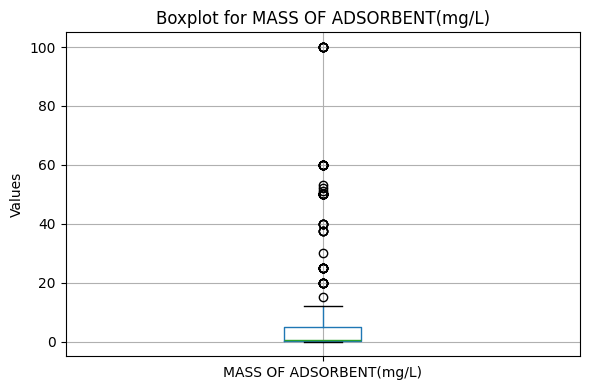

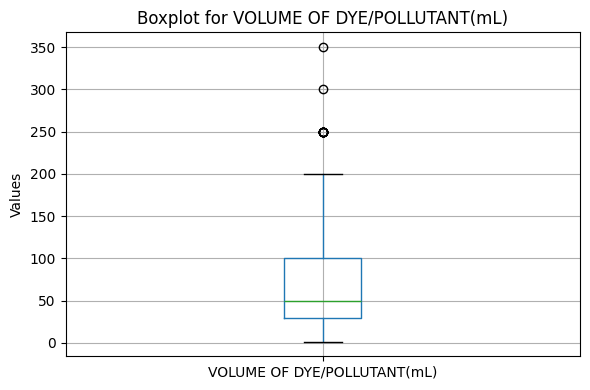

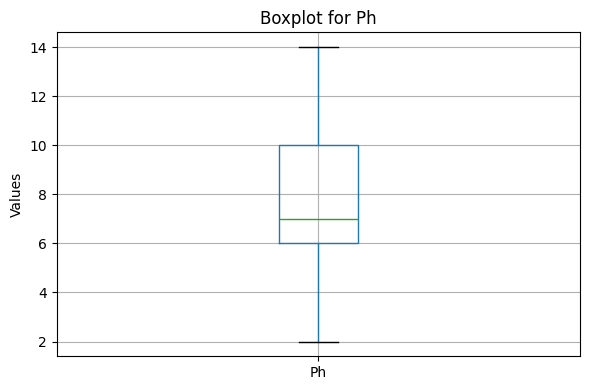

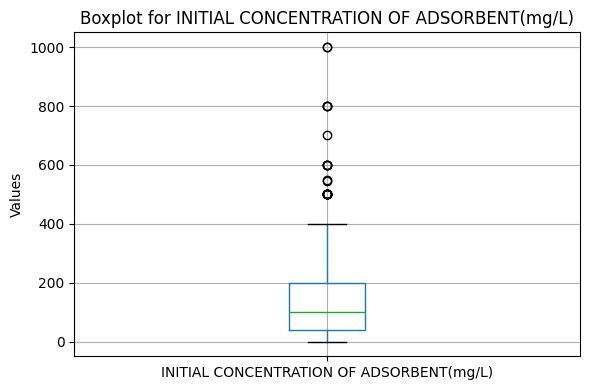

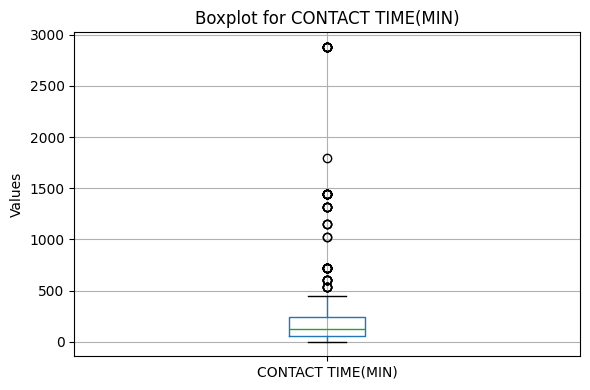

...

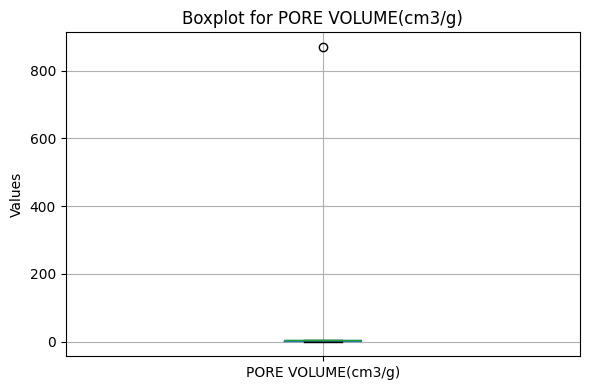

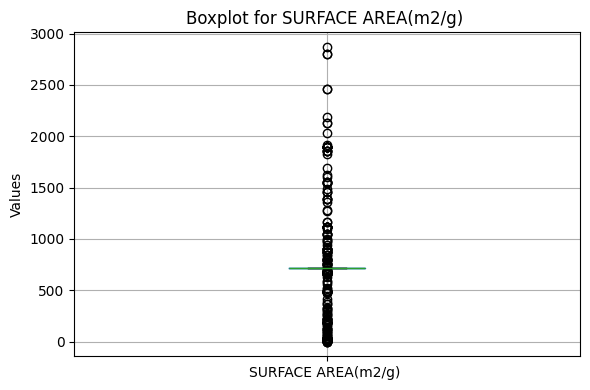

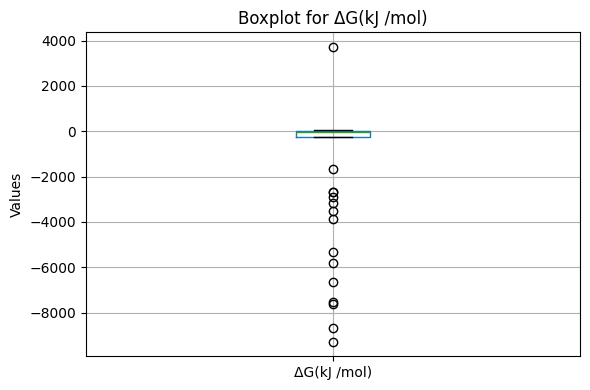

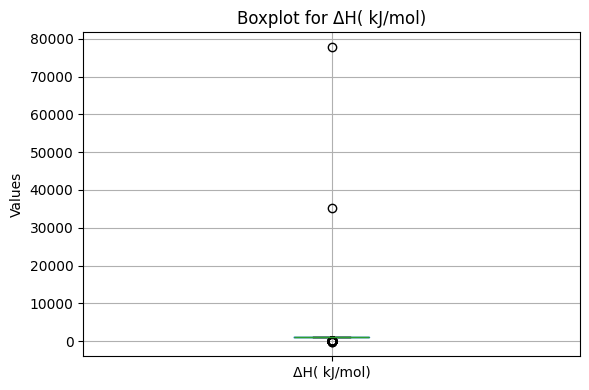

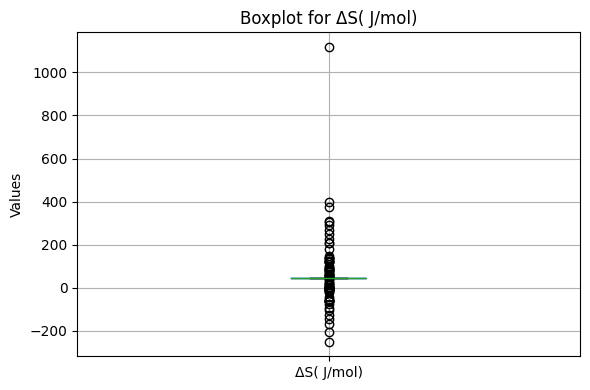

Column 'MASS OF ADSORBENT(mg/L)': 77 outliers (14.26% of values)
Column 'VOLUME OF DYE/POLLUTANT(mL)': 12 outliers (2.22% of values)
Column 'Ph': No outliers found
Column 'INITIAL CONCENTRATION OF ADSORBENT(mg/L)': 29 outliers (5.37% of values)
Column 'CONTACT TIME(MIN)': 59 outliers (10.93% of values)
Column 'TEMPERATURE(K)': 57 outliers (10.56% of values)
Column 'Absorption_Kinetics_PFO_Qexp(mg/g)': 29 outliers (5.37% of values)
Column 'Absorption_Kinetics_PFO_Qe cal(mg/g)': 55 outliers (10.19% of values)
Column 'K1(min-1)': 131 outliers (24.26% of values)
Column 'Absorption_Kinetics_PSO_Qe cal(mg/g)': 57 outliers (10.56% of values)
Column 'Absorption_Kinetics_PSO_K2(mg/g.min)': 120 outliers (22.22% of values)
Column 'Isotherm_Langmuir_Qmax(mg/g)': 2 outliers (0.37% of values)
Column 'Isotherm_Langmuir_KL(L/mg)': 8 outliers (1.48% of values)
Column 'Isotherm_Freundlich_Kf(mg/g)': 29 outliers (5.37% of values)
Column 'Isotherm_Freundlich_1/n': 27 outliers (5.00% of values)
Column 'POR

In [109]:
import matplotlib.pyplot as plt
import numpy as np

# Dictionary to store outliers
outliers_dict = {}

# Select only numerical columns
columns_to_check = df.select_dtypes(include=['int64', 'float64']).columns

# Loop through each column
for col in columns_to_check:
    # Plot individual boxplot
    plt.figure(figsize=(6, 4))
    df.boxplot(column=col)
    plt.title(f"Boxplot for {col}")
    plt.ylabel("Values")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Outlier detection
    q1 = np.quantile(df[col], 0.25)
    q3 = np.quantile(df[col], 0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = df[col][(df[col] < lower_bound) | (df[col] > upper_bound)]
    outliers_dict[col] = outliers.tolist()

# Print summary of outliers for each column
for col, outliers in outliers_dict.items():
    total_outliers = len(outliers)
    total_values = len(df[col])
    percent_outliers = (total_outliers / total_values) * 100

    if total_outliers > 0:
        print(f"Column '{col}': {total_outliers} outliers ({percent_outliers:.2f}% of values)")
    else:
        print(f"Column '{col}': No outliers found")

In [110]:
# Select only numerical columns
columns_to_check = df.select_dtypes(include=['int64', 'float64']).columns

# Loop through each column
for col in columns_to_check:
    # Calculate bounds using IQR method
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Calculate mean of non-outlier values
    non_outlier_mean = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)][col].mean()

    # Replace outliers with the mean
    df[col] = df[col].apply(lambda x: non_outlier_mean if x < lower_bound or x > upper_bound else x)

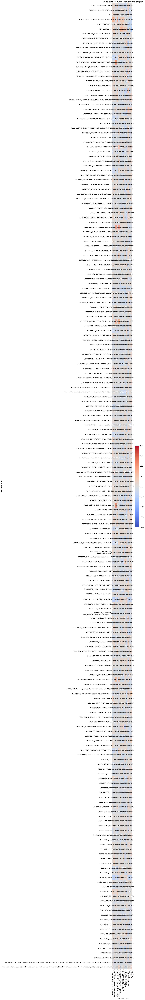

In [111]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# 1. One-hot encode categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
df = pd.get_dummies(df, columns=categorical_cols, drop_first=False)

# 2. Define original (pre-encoded) feature and target columns
target_cols = [
    'Absorption_Kinetics_PFO_Qexp(mg/g)', 'Absorption_Kinetics_PFO_Qe cal(mg/g)', 'K1(min-1)',
    'Absorption_Kinetics_PSO_Qe cal(mg/g)', 'Absorption_Kinetics_PSO_K2(mg/g.min)',
    'Isotherm_Langmuir_Qmax(mg/g)', 'Isotherm_Langmuir_KL(L/mg)', 'Isotherm_Freundlich_Kf(mg/g)',
    'Isotherm_Freundlich_1/n', 'PORE VOLUME(cm3/g)', 'SURFACE AREA(m2/g) ',
    'ΔG(kJ /mol)', 'ΔH( kJ/mol)', 'ΔS( J/mol)'
]

# 3. Identify encoded feature columns (everything not in target list)
feature_cols = [col for col in df.columns if col not in target_cols]

# 4. Normalize the entire dataset (features + targets)
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df[feature_cols + target_cols]), columns=feature_cols + target_cols)

# 5. Compute correlation matrix between features and targets only
correlation_matrix = df_scaled[feature_cols + target_cols].corr()

# Slice the matrix: rows = features, columns = targets
correlation_subset = correlation_matrix.loc[feature_cols, target_cols]

# 6. Plot a single heatmap
plt.figure(figsize=(15, max(8, 0.5 * len(feature_cols))))
sns.heatmap(correlation_subset, annot=True, cmap='coolwarm', center=0, vmin=-1, vmax=1)
plt.title('Correlation Between Features and Targets', fontsize=14)
plt.xlabel('Target Variables')
plt.ylabel('Feature Variables')
plt.tight_layout()
plt.show()

### Step 2: Develop a ML Model


Best Models per Target:
                                   Target              Model        R2  \
0   Absorption_Kinetics_PFO_Qe cal(mg/g)      Random Forest  0.258653   
1     Absorption_Kinetics_PFO_Qexp(mg/g)      Random Forest  0.453640   
2   Absorption_Kinetics_PSO_K2(mg/g.min)                SVR -0.017687   
3   Absorption_Kinetics_PSO_Qe cal(mg/g)      Random Forest  0.366634   
4                Isotherm_Freundlich_1/n      Random Forest  0.368229   
5           Isotherm_Freundlich_Kf(mg/g)  Gradient Boosting  0.302934   
6             Isotherm_Langmuir_KL(L/mg)  Gradient Boosting  0.420143   
7           Isotherm_Langmuir_Qmax(mg/g)      Random Forest  0.310974   
8                              K1(min-1)                SVR -0.057607   
9                     PORE VOLUME(cm3/g)      Random Forest  0.466223   
10                   SURFACE AREA(m2/g)   Linear Regression  0.964549   
11                           ΔG(kJ /mol)      Random Forest  0.505520   
12                       

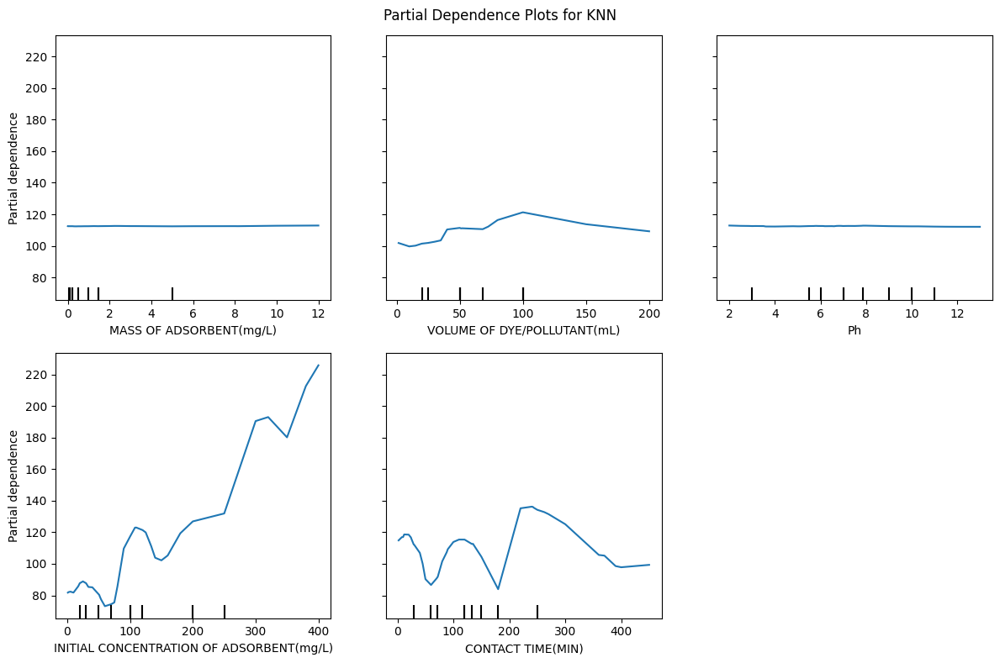

In [112]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.inspection import PartialDependenceDisplay

# 1. Define target and feature columns
target_cols = [
    'Absorption_Kinetics_PFO_Qexp(mg/g)', 'Absorption_Kinetics_PFO_Qe cal(mg/g)', 'K1(min-1)',
    'Absorption_Kinetics_PSO_Qe cal(mg/g)', 'Absorption_Kinetics_PSO_K2(mg/g.min)',
    'Isotherm_Langmuir_Qmax(mg/g)', 'Isotherm_Langmuir_KL(L/mg)', 'Isotherm_Freundlich_Kf(mg/g)',
    'Isotherm_Freundlich_1/n', 'PORE VOLUME(cm3/g)', 'SURFACE AREA(m2/g) ',
    'ΔG(kJ /mol)', 'ΔH( kJ/mol)', 'ΔS( J/mol)'
]

# Define categorical variable (adjust as needed)
categorical_var = 'Category'  # Example column name

feature_cols = [col for col in df.columns if col not in target_cols + [categorical_var]]

# 2. Define ML models
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
    'SVR': SVR(),
    'KNN': KNeighborsRegressor()
}

# 3. Train + Evaluate
results = []

for target in target_cols:
    X = df[feature_cols]
    y = df[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        results.append({
            'Target': target,
            'Model': model_name,
            'R2': r2_score(y_test, y_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
            'MAE': mean_absolute_error(y_test, y_pred)
        })

results_df = pd.DataFrame(results)

# 4. Determine Best Models per Target
best_models_per_target = results_df.loc[results_df.groupby('Target')['R2'].idxmax()].reset_index(drop=True)
print("\nBest Models per Target:\n", best_models_per_target)

# 5. Create Summary Table
numeric_columns = ['R2', 'RMSE', 'MAE']
summary_table = results_df[numeric_columns + ['Model']].groupby('Model').mean().reset_index()
print("\nSummary Table:\n", summary_table)

# 6. Partial Dependence Plots for Best Model
best_model_name = summary_table.loc[summary_table['R2'].idxmax(), 'Model']
print(f"\nBest Model: {best_model_name}")

if best_model_name in models:
    best_model = models[best_model_name]
    X_train, X_test, y_train, y_test = train_test_split(df[feature_cols], df[target_cols[0]], test_size=0.2, random_state=42)
    best_model.fit(X_train, y_train)

    features_to_plot = feature_cols[:5]  # Adjust this list as needed
    fig, ax = plt.subplots(figsize=(12, 8))
    PartialDependenceDisplay.from_estimator(best_model, X_train, features_to_plot, ax=ax)
    plt.suptitle(f"Partial Dependence Plots for {best_model_name}")
    plt.tight_layout()
    plt.show()

    # Categorical Variable Analysis
    if categorical_var in df.columns:
        for category in df[categorical_var].unique():
            subset = df[df[categorical_var] == category]
            if not subset.empty:
                X_cat = subset[feature_cols]
                y_cat = subset[target_cols[0]]  # Using the first target as an example
                fig, ax = plt.subplots(figsize=(12, 8))
                PartialDependenceDisplay.from_estimator(best_model, X_cat, features_to_plot, ax=ax)
                plt.suptitle(f"Partial Dependence for {best_model_name} - {category}")
                plt.tight_layout()
                plt.show()
else:
    print("Best model not found in the defined models.")

In [113]:
import pickle
with open('dye_categorical.pkl', 'wb') as f:
    pickle.dump(best_model, f)

## Without Categorical Variables

### Step 1: Download and preprocess the dataset


In [114]:
import pandas as pd

file_path = '/content/DYE DATAS.xlsx'

# Read the Excel file into a Pandas DataFrame
df = pd.read_excel(file_path)

# Print the first few rows of the DataFrame
print("The first 5 rows of the dataset:")
print(df.head())

# Print the description of the DataFrame
print("The descriptive statistics of the dataset")
print(df.describe())

# Get the data types of all columns
data_types = df.dtypes
# Print the datatypes of each column
print("The data types of each column:")
print(data_types)

# Get the numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
# Get the categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
# Print the results
print("Numeric columns:", numeric_cols)
print("Categorical columns:", categorical_cols)

The first 5 rows of the dataset:
   S/NO       TYPE OF BIOMASS                  ADSORBENT ADSORBATE  \
0   1.0  AGRICULTURAL RESIDUE            AC FROM BAGASSE        MB   
1   2.0        FOREST RESIDUE          AC from Birchwood        MO   
2   NaN        FOREST RESIDUE          AC from Birchwood        MB   
3   3.0  AGRICULTURAL RESIDUE  AC FROM GROUND PALM STEMS        MB   
4   NaN  AGRICULTURAL RESIDUE  AC FROM GROUND PALM STEMS        MB   

  MASS OF ADSORBENT(mg/L) VOLUME OF DYE/POLLUTANT(mL)  Ph  \
0                       6                         100   2   
1                     2.5                          50  11   
2                     2.5                          50  11   
3                    0.03                          80   8   
4                    0.03                          80   8   

   INITIAL CONCENTRATION OF ADSORBENT(mg/L) CONTACT TIME(MIN) TEMPERATURE(K)  \
0                                      30.0               120            298   
1                  

In [115]:
import pandas as pd
import numpy as np

# List of columns to process
target_columns = [
    "MASS OF ADSORBENT(mg/L)",
    "VOLUME OF DYE/POLLUTANT(mL)",
    "Ph",
    "INITIAL CONCENTRATION OF ADSORBENT(mg/L)",
    "CONTACT TIME(MIN)",
    "TEMPERATURE(K)",
    "Absorption_Kinetics_PFO_Qexp(mg/g)",
    "Absorption_Kinetics_PFO_Qe cal(mg/g)",
    "K1(min-1)",
    "Absorption_Kinetics_PSO_Qe cal(mg/g)",
    "Absorption_Kinetics_PSO_K2(mg/g.min)",
    "Isotherm_Langmuir_Qmax(mg/g)",
    "Isotherm_Langmuir_KL(L/mg)",
    "Isotherm_Freundlich_Kf(mg/g)",
    "Isotherm_Freundlich_1/n",
    "PORE VOLUME(cm3/g)",
    "SURFACE AREA(m2/g) ",
    "ΔG(kJ /mol)",
    "ΔH( kJ/mol)",
    "ΔS( J/mol)"
]

# Clean each selected column
for col in target_columns:
    if col in df.columns:
        df[col] = df[col].apply(lambda x: np.nan if isinstance(x, str) and x.strip() == '-' else x)
        df[col] = pd.to_numeric(df[col], errors='coerce')
        mean_val = df[col].mean()
        df[col] = df[col].fillna(mean_val)

# Optional: Save cleaned version
# df.to_excel("cleaned_selected_columns_with_means.xlsx", index=False)

# Preview the result
print(df[target_columns].head())

# Get the data types of all columns
data_types = df.dtypes
# Print the datatypes of each column
print("The data types of each column:")
print(data_types)

# Get the numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
# Get the categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
# Print the results
print("Numeric columns:", numeric_cols)
print("Categorical columns:", categorical_cols)

   MASS OF ADSORBENT(mg/L)  VOLUME OF DYE/POLLUTANT(mL)    Ph  \
0                     6.00                        100.0   2.0   
1                     2.50                         50.0  11.0   
2                     2.50                         50.0  11.0   
3                     0.03                         80.0   8.0   
4                     0.03                         80.0   8.0   

   INITIAL CONCENTRATION OF ADSORBENT(mg/L)  CONTACT TIME(MIN)  \
0                                      30.0              120.0   
1                                     100.0             1020.0   
2                                     100.0             1020.0   
3                                      30.0             1440.0   
4                                      50.0             1440.0   

   TEMPERATURE(K)  Absorption_Kinetics_PFO_Qexp(mg/g)  \
0           298.0                                0.59   
1           293.0                              220.19   
2           293.0                        

In [116]:
# Drop the 'S/NO' column if it exists
df = df.drop(columns=['S/NO', 'Unnamed: 24'], errors='ignore')

df = df.drop(columns=categorical_cols, errors='ignore')

# Get the data types of all columns
data_types = df.dtypes
# Print the datatypes of each column
print("The data types of each column:")
print(data_types)

# Get the numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
# Get the categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
# Print the results
print("Numeric columns:", numeric_cols)
print("Categorical columns:", categorical_cols)

The data types of each column:
MASS OF ADSORBENT(mg/L)                     float64
VOLUME OF DYE/POLLUTANT(mL)                 float64
Ph                                          float64
INITIAL CONCENTRATION OF ADSORBENT(mg/L)    float64
CONTACT TIME(MIN)                           float64
TEMPERATURE(K)                              float64
Absorption_Kinetics_PFO_Qexp(mg/g)          float64
Absorption_Kinetics_PFO_Qe cal(mg/g)        float64
K1(min-1)                                   float64
Absorption_Kinetics_PSO_Qe cal(mg/g)        float64
Absorption_Kinetics_PSO_K2(mg/g.min)        float64
Isotherm_Langmuir_Qmax(mg/g)                float64
Isotherm_Langmuir_KL(L/mg)                  float64
Isotherm_Freundlich_Kf(mg/g)                float64
Isotherm_Freundlich_1/n                     float64
PORE VOLUME(cm3/g)                          float64
SURFACE AREA(m2/g)                          float64
ΔG(kJ /mol)                                 float64
ΔH( kJ/mol)                      

In [117]:
import pandas as pd
import numpy as np

# Step 1: Check for missing data
missing_data = df.isnull().sum()
print("Total missing values for each column before filling:")
print(missing_data[missing_data > 0])

df = df.dropna()

# Show how many columns still have missing values
print("\nMissing values in each column after handling:")
print(df.isnull().sum()[df.isnull().sum() > 0])

Total missing values for each column before filling:
Series([], dtype: int64)

Missing values in each column after handling:
Series([], dtype: int64)


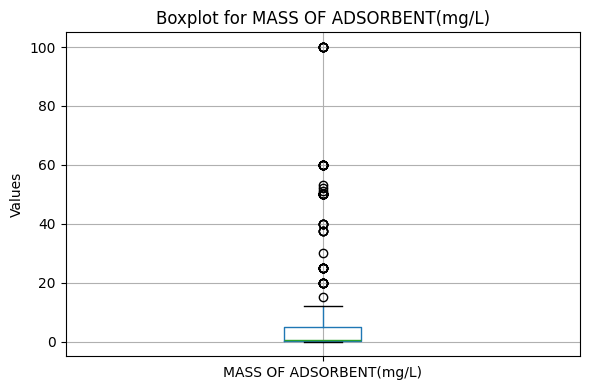

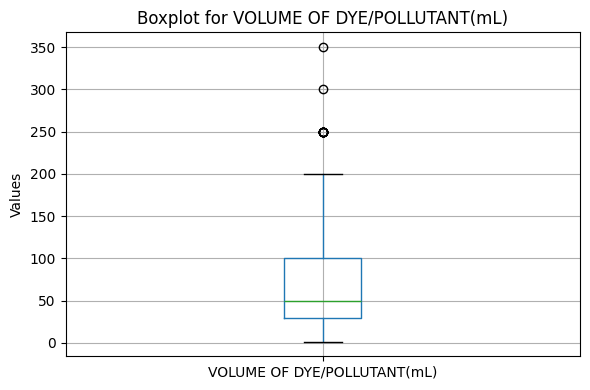

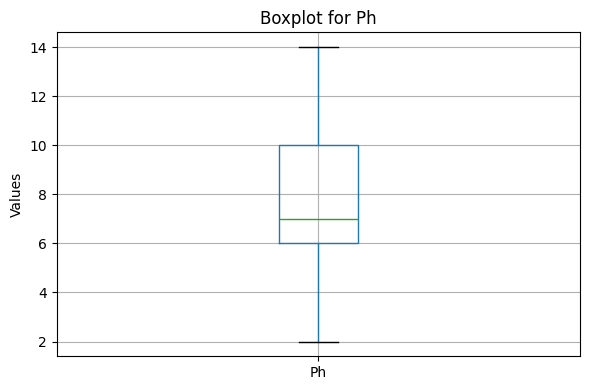

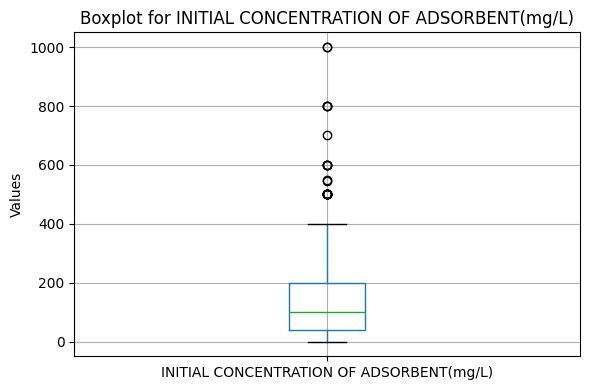

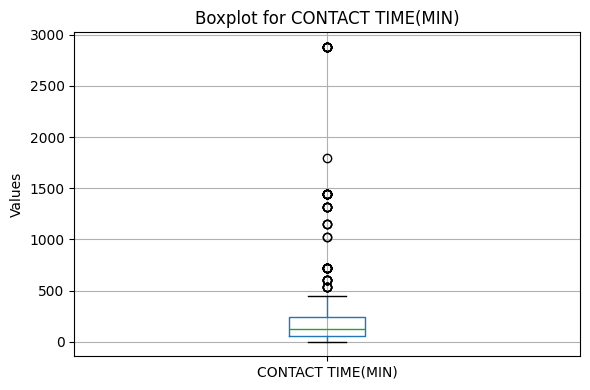

...

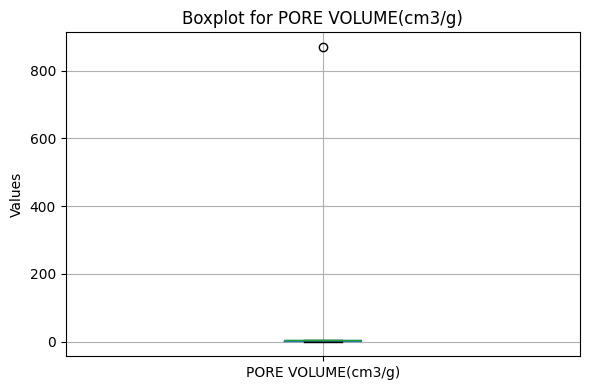

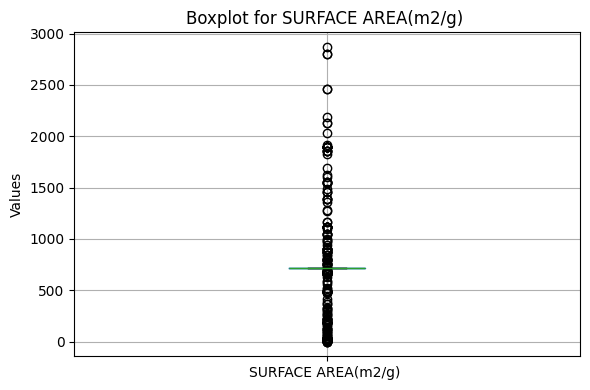

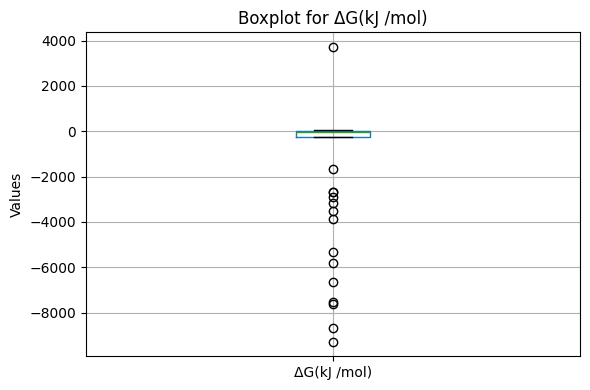

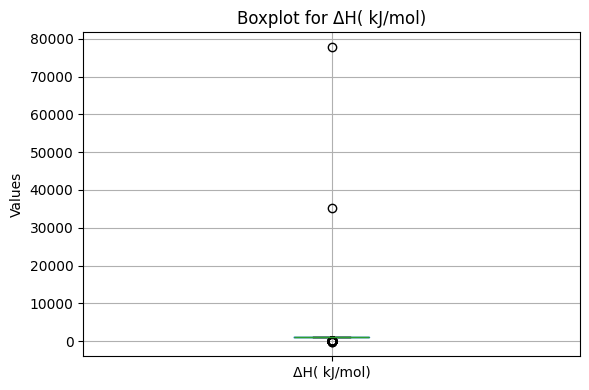

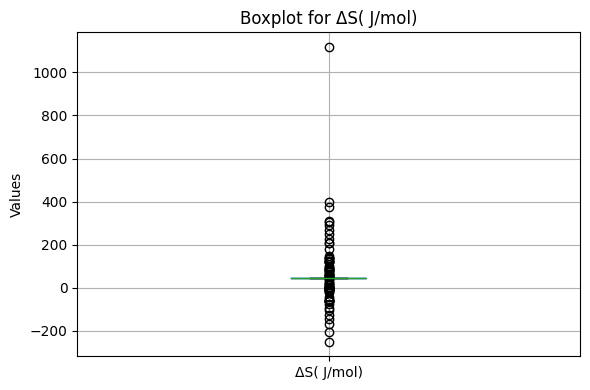

Column 'MASS OF ADSORBENT(mg/L)': 77 outliers (14.26% of values)
Column 'VOLUME OF DYE/POLLUTANT(mL)': 12 outliers (2.22% of values)
Column 'Ph': No outliers found
Column 'INITIAL CONCENTRATION OF ADSORBENT(mg/L)': 29 outliers (5.37% of values)
Column 'CONTACT TIME(MIN)': 59 outliers (10.93% of values)
Column 'TEMPERATURE(K)': 57 outliers (10.56% of values)
Column 'Absorption_Kinetics_PFO_Qexp(mg/g)': 29 outliers (5.37% of values)
Column 'Absorption_Kinetics_PFO_Qe cal(mg/g)': 55 outliers (10.19% of values)
Column 'K1(min-1)': 131 outliers (24.26% of values)
Column 'Absorption_Kinetics_PSO_Qe cal(mg/g)': 57 outliers (10.56% of values)
Column 'Absorption_Kinetics_PSO_K2(mg/g.min)': 120 outliers (22.22% of values)
Column 'Isotherm_Langmuir_Qmax(mg/g)': 2 outliers (0.37% of values)
Column 'Isotherm_Langmuir_KL(L/mg)': 8 outliers (1.48% of values)
Column 'Isotherm_Freundlich_Kf(mg/g)': 29 outliers (5.37% of values)
Column 'Isotherm_Freundlich_1/n': 27 outliers (5.00% of values)
Column 'POR

In [118]:
import matplotlib.pyplot as plt
import numpy as np

# Dictionary to store outliers
outliers_dict = {}

# Select only numerical columns
columns_to_check = df.select_dtypes(include=['int64', 'float64']).columns

# Loop through each column
for col in columns_to_check:
    # Plot individual boxplot
    plt.figure(figsize=(6, 4))
    df.boxplot(column=col)
    plt.title(f"Boxplot for {col}")
    plt.ylabel("Values")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Outlier detection
    q1 = np.quantile(df[col], 0.25)
    q3 = np.quantile(df[col], 0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = df[col][(df[col] < lower_bound) | (df[col] > upper_bound)]
    outliers_dict[col] = outliers.tolist()

# Print summary of outliers for each column
for col, outliers in outliers_dict.items():
    total_outliers = len(outliers)
    total_values = len(df[col])
    percent_outliers = (total_outliers / total_values) * 100

    if total_outliers > 0:
        print(f"Column '{col}': {total_outliers} outliers ({percent_outliers:.2f}% of values)")
    else:
        print(f"Column '{col}': No outliers found")

In [119]:
# Select only numerical columns
columns_to_check = df.select_dtypes(include=['int64', 'float64']).columns

# Loop through each column
for col in columns_to_check:
    # Calculate bounds using IQR method
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Calculate mean of non-outlier values
    non_outlier_mean = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)][col].mean()

    # Replace outliers with the mean
    df[col] = df[col].apply(lambda x: non_outlier_mean if x < lower_bound or x > upper_bound else x)

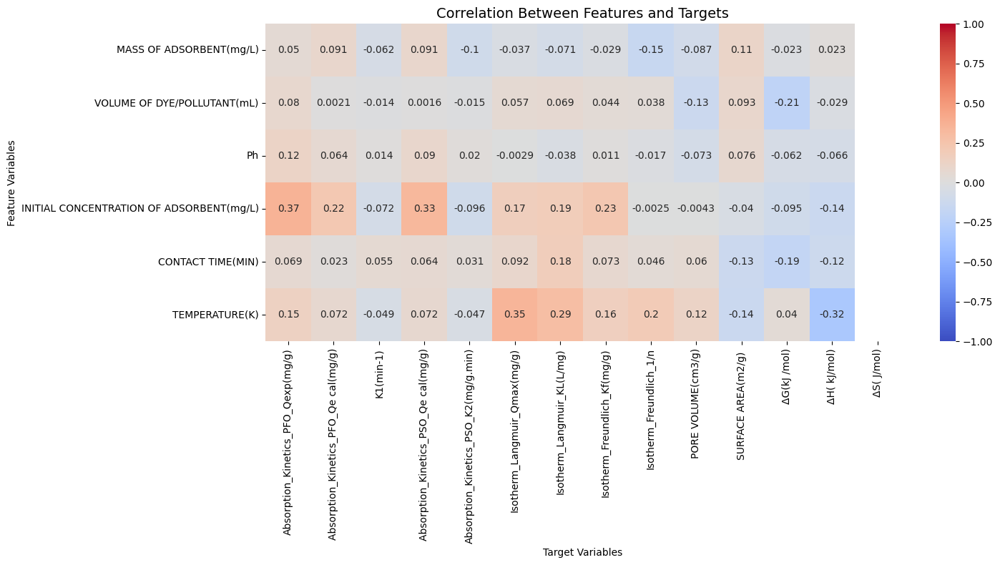

In [120]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# 1. One-hot encode categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
## df = pd.get_dummies(df, columns=categorical_cols, drop_first=False)

# 2. Define original (pre-encoded) feature and target columns
target_cols = [
    'Absorption_Kinetics_PFO_Qexp(mg/g)', 'Absorption_Kinetics_PFO_Qe cal(mg/g)', 'K1(min-1)',
    'Absorption_Kinetics_PSO_Qe cal(mg/g)', 'Absorption_Kinetics_PSO_K2(mg/g.min)',
    'Isotherm_Langmuir_Qmax(mg/g)', 'Isotherm_Langmuir_KL(L/mg)', 'Isotherm_Freundlich_Kf(mg/g)',
    'Isotherm_Freundlich_1/n', 'PORE VOLUME(cm3/g)', 'SURFACE AREA(m2/g) ',
    'ΔG(kJ /mol)', 'ΔH( kJ/mol)', 'ΔS( J/mol)'
]

# 3. Identify encoded feature columns (everything not in target list)
feature_cols = [col for col in df.columns if col not in target_cols]

# 4. Normalize the entire dataset (features + targets)
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df[feature_cols + target_cols]), columns=feature_cols + target_cols)

# 5. Compute correlation matrix between features and targets only
correlation_matrix = df_scaled[feature_cols + target_cols].corr()

# Slice the matrix: rows = features, columns = targets
correlation_subset = correlation_matrix.loc[feature_cols, target_cols]

# 6. Plot a single heatmap
plt.figure(figsize=(15, max(8, 0.5 * len(feature_cols))))
sns.heatmap(correlation_subset, annot=True, cmap='coolwarm', center=0, vmin=-1, vmax=1)
plt.title('Correlation Between Features and Targets', fontsize=14)
plt.xlabel('Target Variables')
plt.ylabel('Feature Variables')
plt.tight_layout()
plt.show()

### Step 2: Develop a ML Model


Best Models per Target:
                                   Target              Model        R2  \
0   Absorption_Kinetics_PFO_Qe cal(mg/g)      Random Forest  0.060631   
1     Absorption_Kinetics_PFO_Qexp(mg/g)      Random Forest  0.370630   
2   Absorption_Kinetics_PSO_K2(mg/g.min)                SVR -0.015215   
3   Absorption_Kinetics_PSO_Qe cal(mg/g)      Random Forest  0.337632   
4                Isotherm_Freundlich_1/n      Random Forest  0.430279   
5           Isotherm_Freundlich_Kf(mg/g)      Random Forest  0.235554   
6             Isotherm_Langmuir_KL(L/mg)  Gradient Boosting  0.294516   
7           Isotherm_Langmuir_Qmax(mg/g)      Random Forest  0.307854   
8                              K1(min-1)                SVR -0.051502   
9                     PORE VOLUME(cm3/g)  Gradient Boosting  0.379060   
10                   SURFACE AREA(m2/g)                 KNN  0.945347   
11                           ΔG(kJ /mol)      Random Forest  0.533562   
12                       

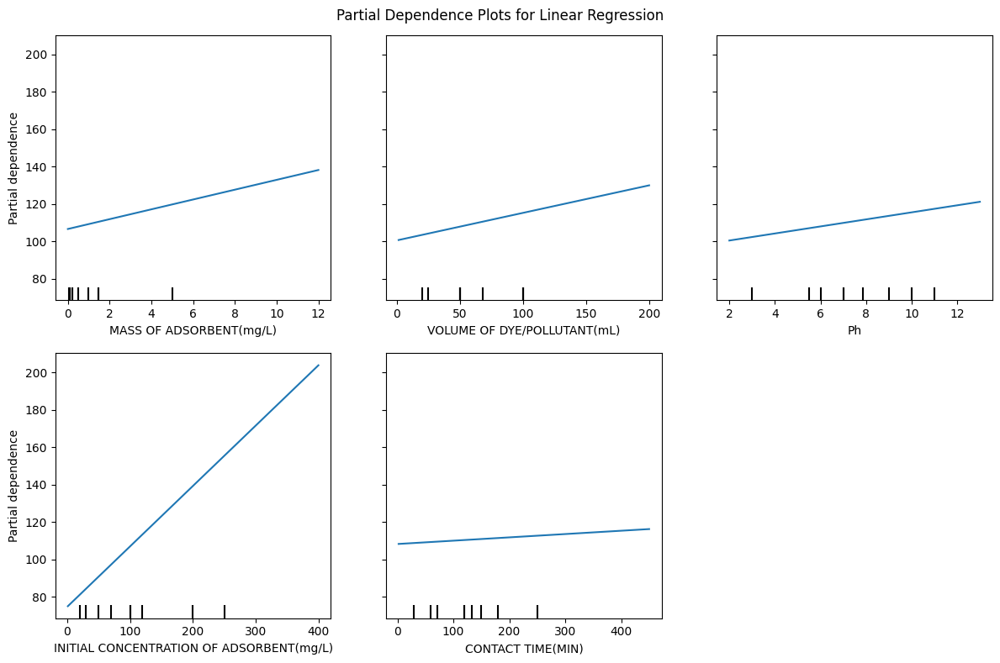

In [121]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.inspection import PartialDependenceDisplay

# 1. Define target and feature columns
target_cols = [
    'Absorption_Kinetics_PFO_Qexp(mg/g)', 'Absorption_Kinetics_PFO_Qe cal(mg/g)', 'K1(min-1)',
    'Absorption_Kinetics_PSO_Qe cal(mg/g)', 'Absorption_Kinetics_PSO_K2(mg/g.min)',
    'Isotherm_Langmuir_Qmax(mg/g)', 'Isotherm_Langmuir_KL(L/mg)', 'Isotherm_Freundlich_Kf(mg/g)',
    'Isotherm_Freundlich_1/n', 'PORE VOLUME(cm3/g)', 'SURFACE AREA(m2/g) ',
    'ΔG(kJ /mol)', 'ΔH( kJ/mol)', 'ΔS( J/mol)'
]

# Define categorical variable (adjust as needed)
categorical_var = 'Category'  # Example column name

feature_cols = [col for col in df.columns if col not in target_cols + [categorical_var]]

# 2. Define ML models
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
    'SVR': SVR(),
    'KNN': KNeighborsRegressor()
}

# 3. Train + Evaluate
results = []

for target in target_cols:
    X = df[feature_cols]
    y = df[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        results.append({
            'Target': target,
            'Model': model_name,
            'R2': r2_score(y_test, y_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
            'MAE': mean_absolute_error(y_test, y_pred)
        })

results_df = pd.DataFrame(results)

# 4. Determine Best Models per Target
best_models_per_target = results_df.loc[results_df.groupby('Target')['R2'].idxmax()].reset_index(drop=True)
print("\nBest Models per Target:\n", best_models_per_target)

# 5. Create Summary Table
numeric_columns = ['R2', 'RMSE', 'MAE']
summary_table = results_df[numeric_columns + ['Model']].groupby('Model').mean().reset_index()
print("\nSummary Table:\n", summary_table)

# 6. Partial Dependence Plots for Best Model
best_model_name = summary_table.loc[summary_table['R2'].idxmax(), 'Model']
print(f"\nBest Model: {best_model_name}")

if best_model_name in models:
    best_model = models[best_model_name]
    X_train, X_test, y_train, y_test = train_test_split(df[feature_cols], df[target_cols[0]], test_size=0.2, random_state=42)
    best_model.fit(X_train, y_train)

    features_to_plot = feature_cols[:5]  # Adjust this list as needed
    fig, ax = plt.subplots(figsize=(12, 8))
    PartialDependenceDisplay.from_estimator(best_model, X_train, features_to_plot, ax=ax)
    plt.suptitle(f"Partial Dependence Plots for {best_model_name}")
    plt.tight_layout()
    plt.show()

    # Categorical Variable Analysis
    if categorical_var in df.columns:
        for category in df[categorical_var].unique():
            subset = df[df[categorical_var] == category]
            if not subset.empty:
                X_cat = subset[feature_cols]
                y_cat = subset[target_cols[0]]  # Using the first target as an example
                fig, ax = plt.subplots(figsize=(12, 8))
                PartialDependenceDisplay.from_estimator(best_model, X_cat, features_to_plot, ax=ax)
                plt.suptitle(f"Partial Dependence for {best_model_name} - {category}")
                plt.tight_layout()
                plt.show()
else:
    print("Best model not found in the defined models.")

In [122]:
import pickle
with open('dye_no_categorical.pkl', 'wb') as f:
    pickle.dump(best_model, f)